## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, Load the required libraray

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from IPython.display import HTML
from moviepy.editor import VideoFileClip
from collections import deque
%matplotlib inline

## Then, I'll compute the camera calibration using chessboard images

The goal is to get the calibration matrix and distortion coefficients.

* a set of chessboard image are given.

---

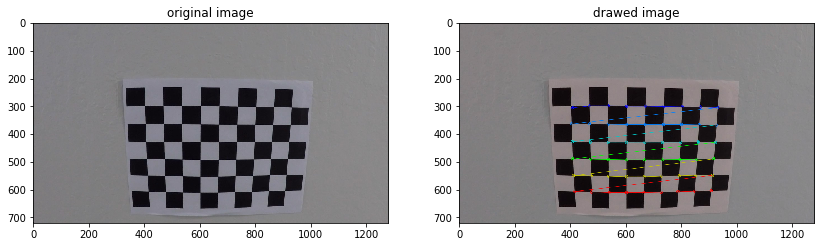

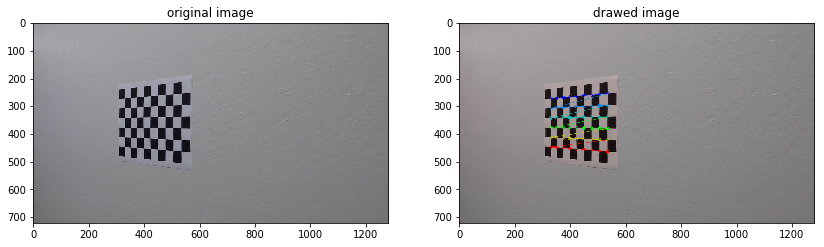

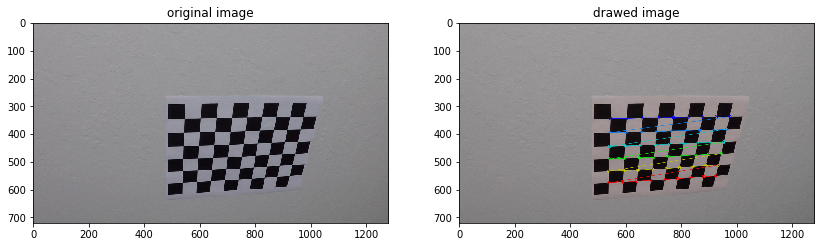

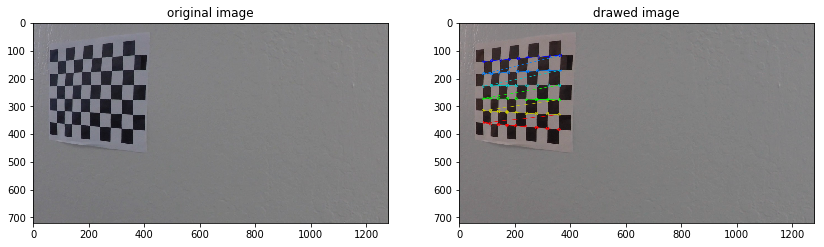

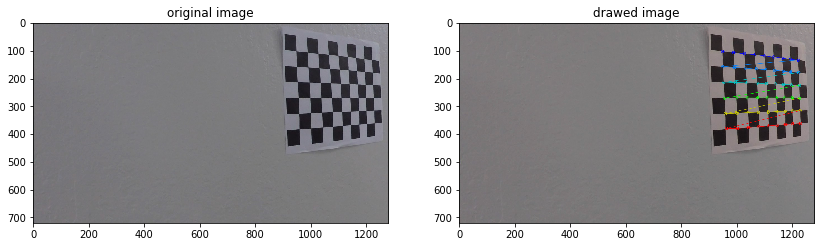

...

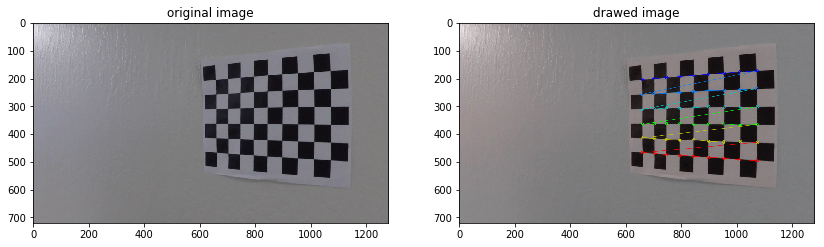

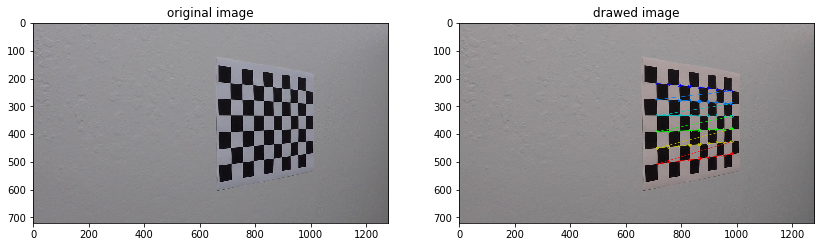

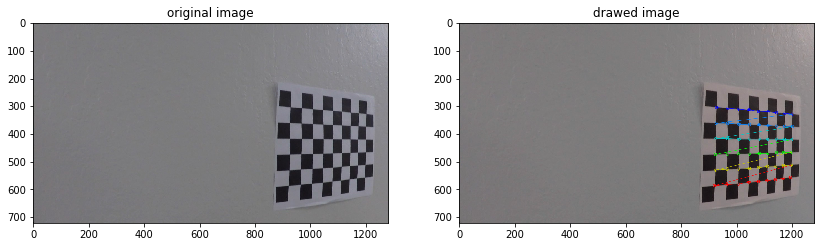

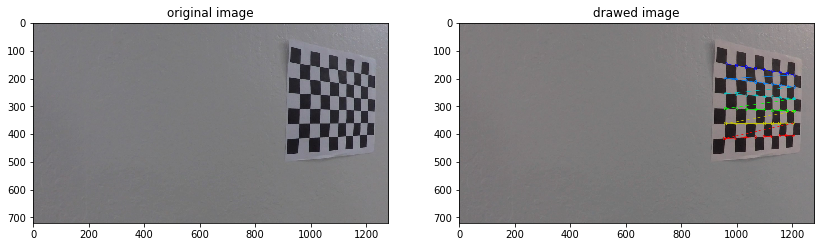

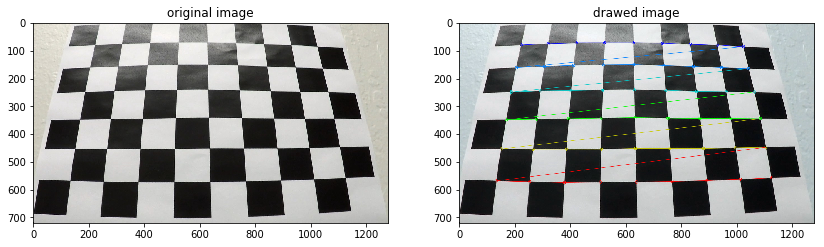

In [3]:
# def undistort_image(image):
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space.
imgpoints = [] # 2d points in image plane.

#     img = cv2.imread(image) 

#     gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
#     ext, corners = cv2.findChessboardCorners(gray, (9,6),None)

#     if ext == True:
#         objpoints.append(objp)
#         imgpoints.append(corners)
#         ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
#         undistort_pic = cv2.undistort(img, mtx, dist, None, mtx)

#     return undistort_pic
# Make a list of calibration images
images = glob.glob('../CarND-Advanced-Lane-Lines/camera_cal/calibration*')
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    #Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
         
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1,2, figsize = (14,8))
        ax1.imshow(mpimg.imread(fname))
        ax1.set_title("original image")
        ax2.imshow(img)
        ax2.set_title("drawed image")
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

## Show the original and the undistorted image blow

In [4]:
# def undistort_op(img):
#     image = mpimg.imread(img)
#     objp = np.zeros((6*9,3), np.float32)
#     objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
#     gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
#     ret, corner = cv2.findChessboardCorners(gray,(9,6),None)
    
#     if ret == True:
       
#         _, dist, mtx, rvecs, tvecs = cv2.calibrateCamera(objp, corner, gray.shape[::-1], None, None)
#     return cv2.undistort(img, mtx, dist, None, mtx)
        
def undistort_op(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

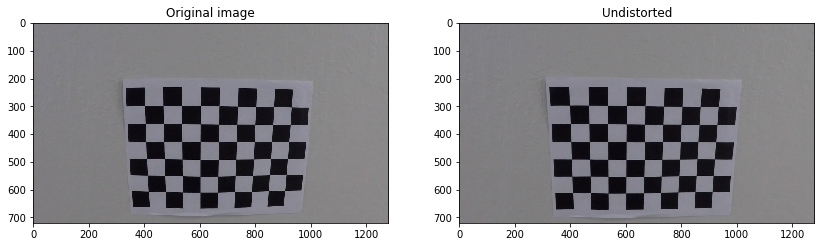

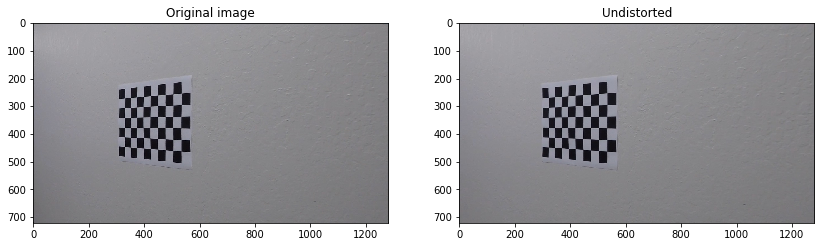

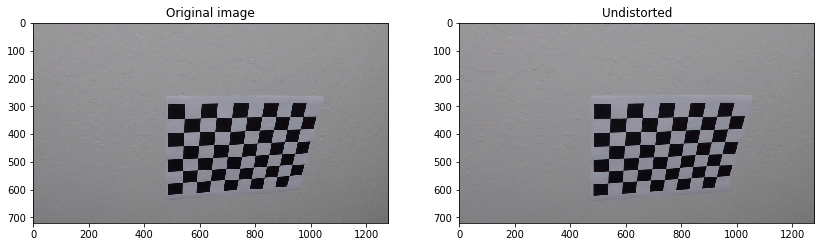

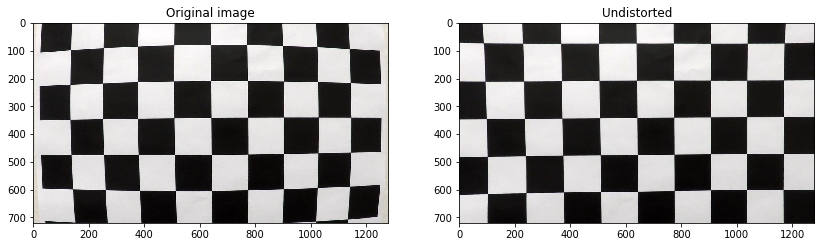

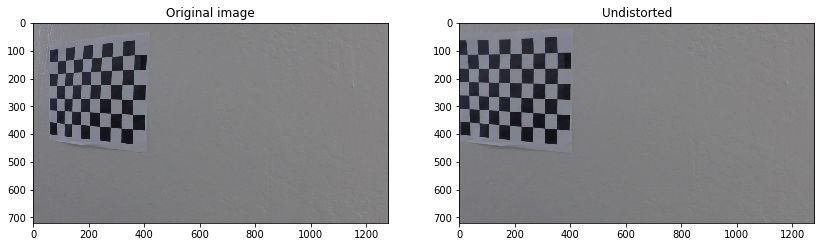

...

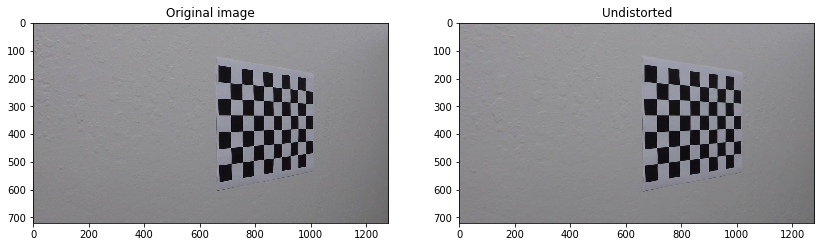

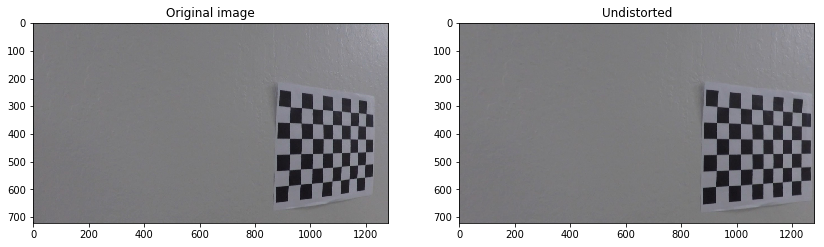

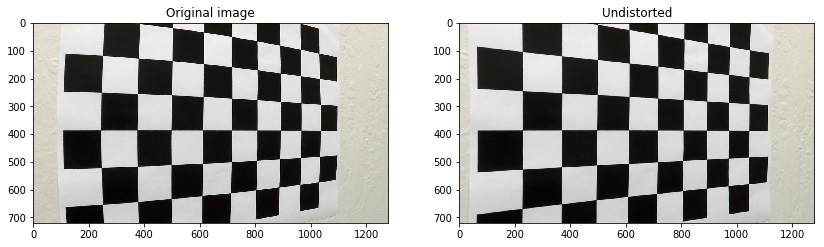

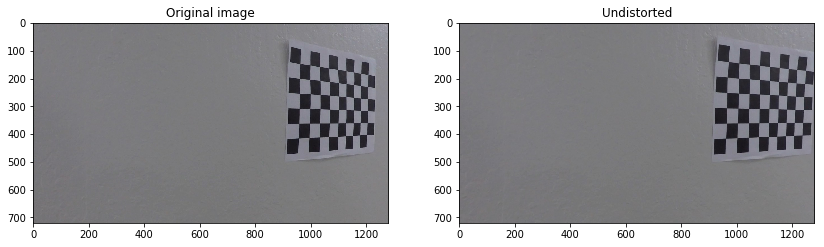

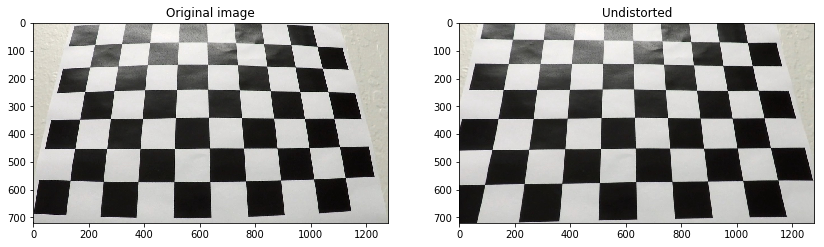

In [5]:

for fname in images:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,8))
    ax1.imshow(mpimg.imread(fname))
    ax1.set_title("Original image")
    undistort_img = undistort_op(mpimg.imread(fname))
    ax2.imshow(undistort_img)
    ax2.set_title("Undistorted")
    plt.savefig("../CarND-Advanced-Lane-Lines/output_images/cali_output.png")

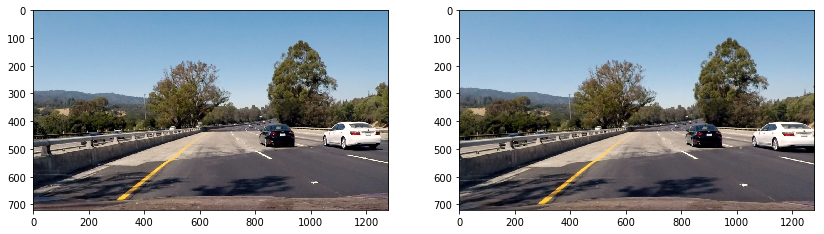

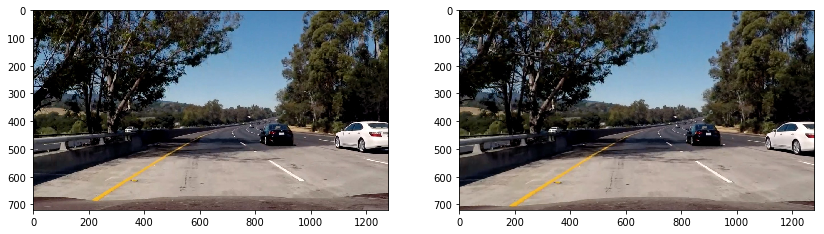

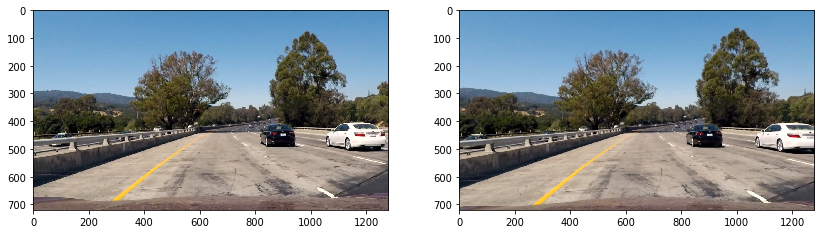

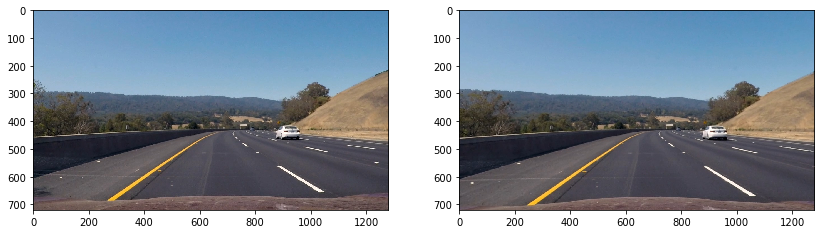

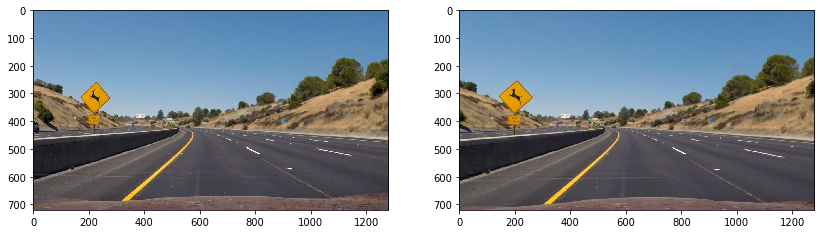

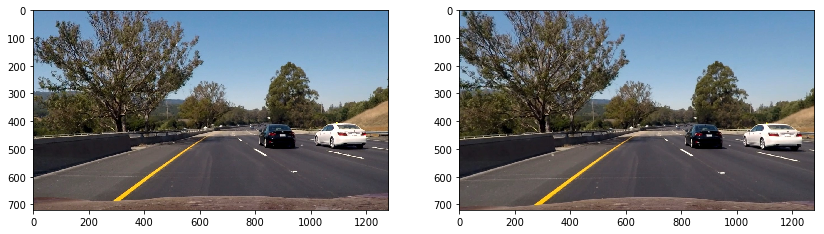

In [6]:
scenarios = glob.glob('../CarND-Advanced-Lane-Lines/test_images/test*.jpg')
for image in scenarios:
    image1 = mpimg.imread(image)
    undi = undistort_op(mpimg.imread(image))
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,9))
    ax1.imshow(image1)
    ax2.imshow(undi)
    plt.savefig("../CarND-Advanced-Lane-Lines/output_images/undis_output.png")

## Binary Image

In this step, choose to find the best filter to select the yellow and white lane on the road image. here i found some useful 
information about how to choose the color space and the corresponding filters.

* The S Channel from the HLS color space, with a min threshold of 180 and a max threshold of 255, did a fairly good job of identifying both the white and yellow lane lines, but did not pick up 100% of the pixels in either one, and had a tendency to get distracted by shadows on the road.
* The L Channel from the LUV color space, with a min threshold of 225 and a max threshold of 255, did an almost perfect job of picking up the white lane lines, but completely ignored the yellow lines.
* The B channel from the Lab color space, with a min threshold of 155 and an upper threshold of 200, did a better job than the S channel in identifying the yellow lines, but completely ignored the white lines. 

In [7]:
def sobel_x(img, threhold= [30,255]):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray,  cv2.CV_64F,1,0)
    scaled_sobelx = np.uint8(255*sobelx/np.max(sobelx))
    binary_sobelx = np.zeros_like(gray)
    binary_sobelx[(scaled_sobelx > threhold[0])&(scaled_sobelx<threhold[1])] = 1
    
    return binary_sobelx

In [8]:
def sobel_y(img, threhold = [35,255]):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1)
    sobely_scaled = np.uint8(255*sobely/np.max(sobely))
    binary_sobely = np.zeros_like(gray)
    binary_sobely[(sobely_scaled > threhold[0])&(sobely_scaled<threhold[1])] = 1
    
    return binary_sobely

In [9]:
def sobel_mag(img, threhold = [60,255]):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1)
    sobel = np.sqrt(sobelx**2+sobely**2)
    sobel_scaled = np.uint8(255*sobel/np.max(sobel))
    binary_sobel = np.zeros_like(gray)
    binary_sobel[(sobel_scaled < threhold[1])&(sobel_scaled>threhold[0])] = 1
    
    return binary_sobel

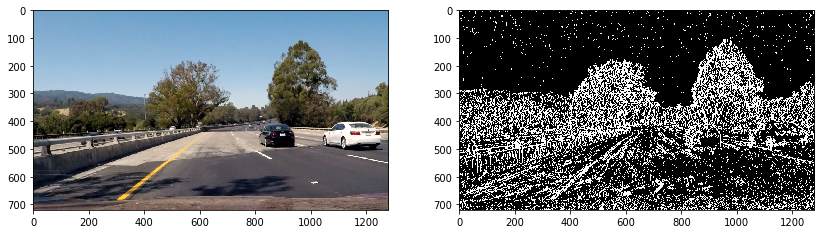

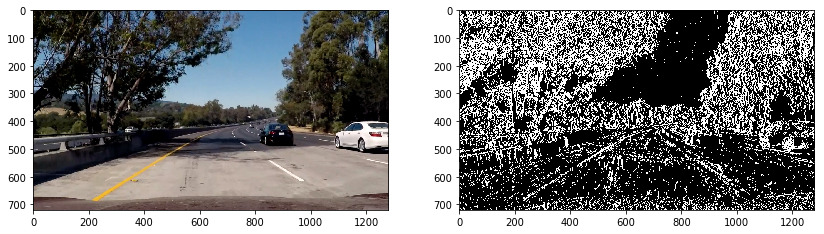

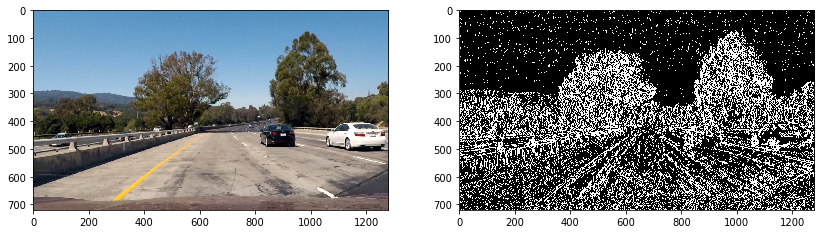

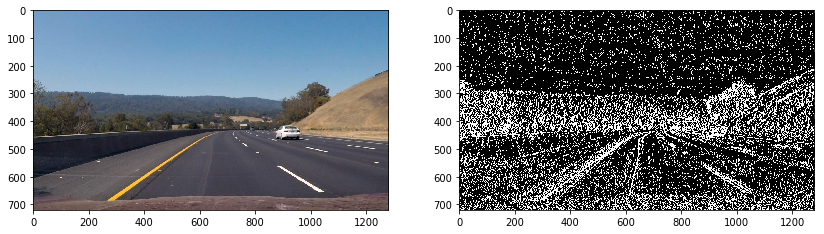

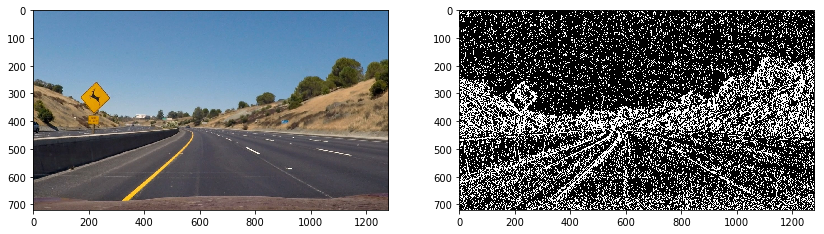

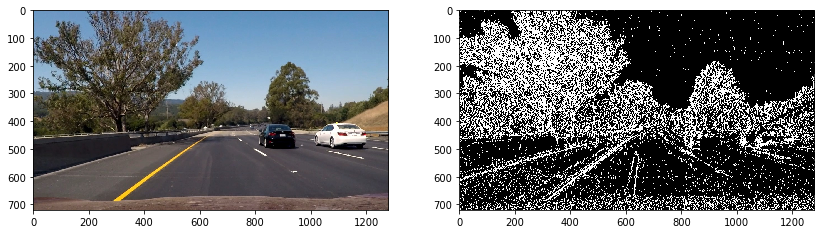

In [10]:
scenarios = glob.glob('../CarND-Advanced-Lane-Lines/test_images/test*.jpg')
for image in scenarios:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,9))
    ax1.imshow(mpimg.imread(image))
    ax2.imshow(sobel_x(cv2.imread(image)),cmap = 'gray')

In [11]:
def sobel_dirc(img, threhold = [0.3,1.4]):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1)
    sobel_dirc = np.arctan2(np.absolute(sobely),np.absolute(sobelx))
#     sobel_dirc_scaled = np.uint8(sobel_dirc*255/np.max(sobel_dirc))
    binary_sobel = np.zeros_like(gray)
    binary_sobel[(sobel_dirc < threhold[1]) & (sobel_dirc > threhold[0])] = 1
    
    return binary_sobel

In [12]:
def Colorspace_threhold(img, s_threhold =[160,255], b_threhold =[145,200],l_threhold = [200,255]):
    
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    luv = cv2.cvtColor(img,cv2.COLOR_BGR2LUV)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    
    s_channel = hls[:,:,2]
    l_channel = luv[:,:,0]
    b_channel = lab[:,:,2]
    
    binary_color = np.zeros_like(s_channel)
    binary_color[((s_channel>s_threhold[0])&(s_channel<s_threhold[1]))|((l_channel>l_threhold[0])&(l_channel<l_threhold[1]))|((b_channel>b_threhold[0])&(b_channel<b_threhold[1]))] = 1
    
    return binary_color

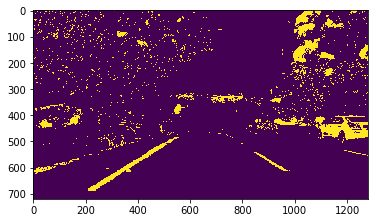

In [13]:
def HLS_Color_Gradient(img):
    

    sobelx = sobel_x(img)
    sobely = sobel_y(img)
    sobel = sobel_mag(img)
    dirc = sobel_dirc(img)
    colorspace = Colorspace_threhold(img)
#     hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
#     l_image = hls[:,:,1]
#     s_image = hls[:,:,2]
    
#     sobelx = cv2.Sobel(l_image, cv2.CV_64F, 1, 0)
#     sobely = cv2.Sobel(l_image, cv2.CV_64F, 0, 1)
#     sobel_all = np.sqrt(sobelx**2+sobely**2)
#     scaled_sobel = np.uint8(255*sobel_all/np.max(sobel_all))
#     binary_sobel = np.zeros_like(l_image)
#     binary_sobel[(sobel_all>sobel_threhold[0])&(sobel_all<sobel_threhold[1])] = 1 #这里一定要加括号
    
    HLS_binary = np.zeros_like(sobelx)
#     s_binary[(s_image>s_threhold[0])&(s_image<s_threhold[1])] = 1
    
    #dstack() takes 1 positional argument!
    HLS_binary[((sobelx == 1)&(sobely == 1)&(sobel ==1)) | (colorspace ==1)|((sobel ==1)&(dirc ==1)) ] = 1
#     HLS_binary[colorspace ==1] = 1
    
    return HLS_binary

plt.imshow(Colorspace_threhold(cv2.imread(scenarios[1])))

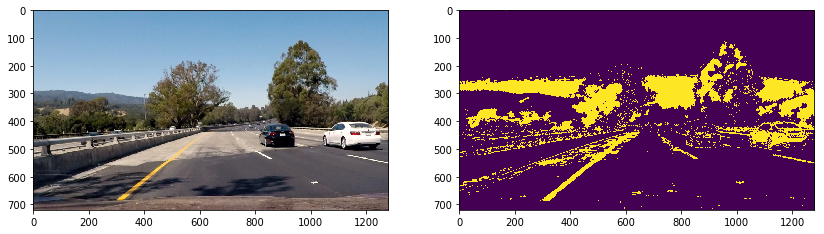

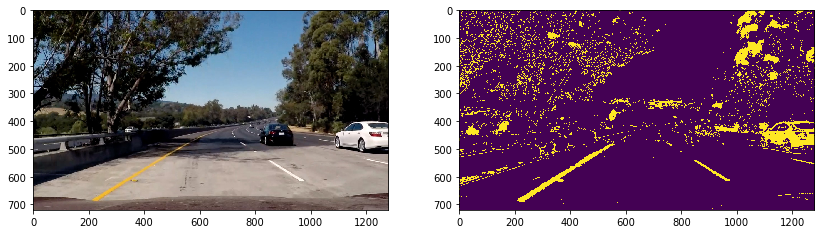

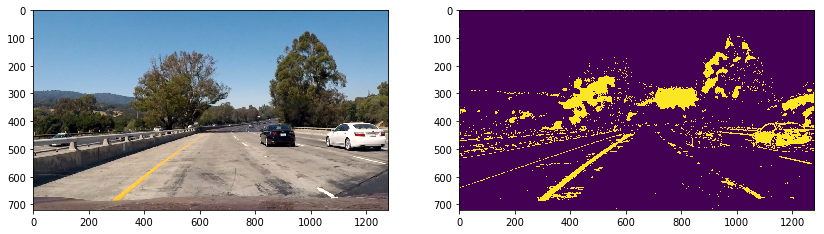

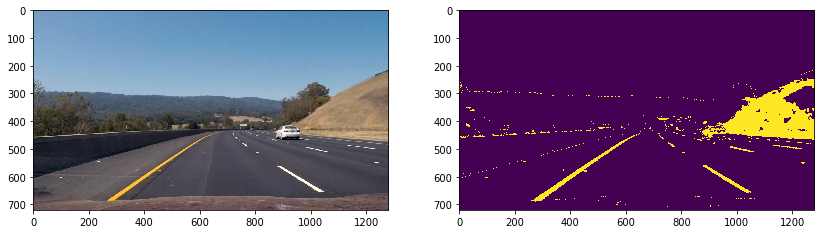

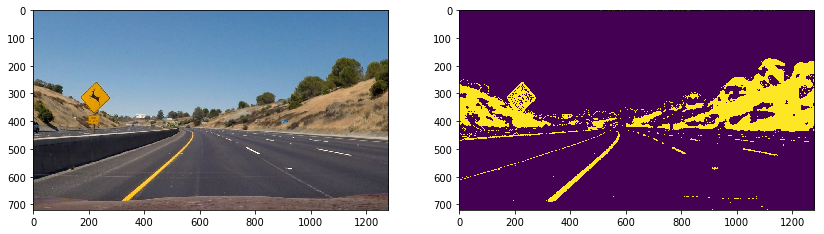

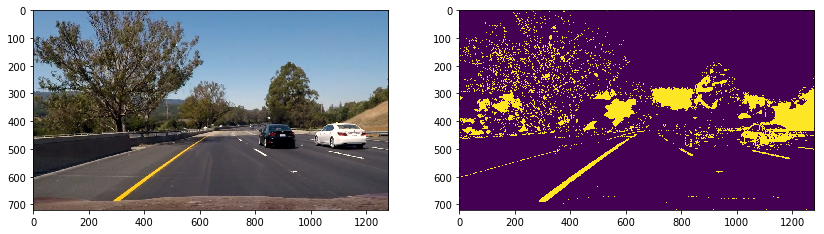

In [14]:
scenarios = glob.glob('../CarND-Advanced-Lane-Lines/test_images/test*.jpg')

for image in scenarios:
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,10))
    ax1.imshow(mpimg.imread(image))
    ax2.imshow(HLS_Color_Gradient(cv2.imread(image)))
    plt.savefig("../CarND-Advanced-Lane-Lines/output_images/binary_output.png")

## Perspective Transform

In [15]:
def Perspective_trans(img):
    imshape = img.shape
    src = np.float32([[490, 482], [810, 482],
                      [1250, 720], [40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                      [1250, 720], [40, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped_image = cv2.warpPerspective(img, M, (imshape[1],imshape[0]), flags = cv2.INTER_LINEAR)
    
    return warped_image

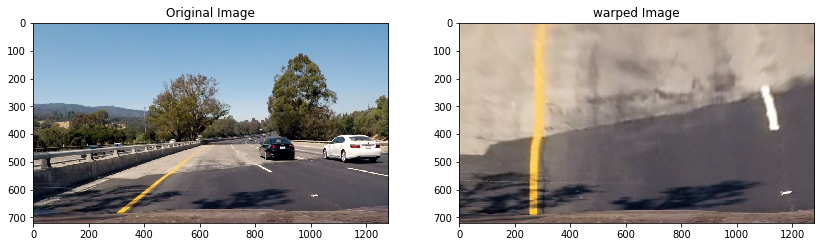

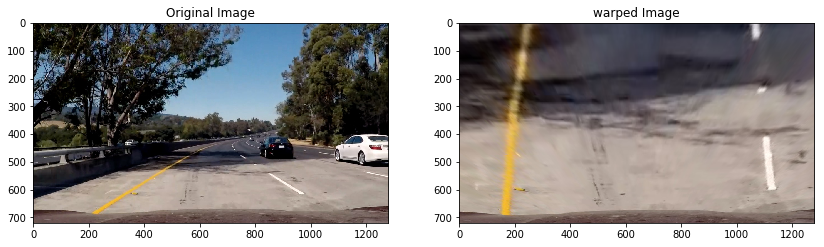

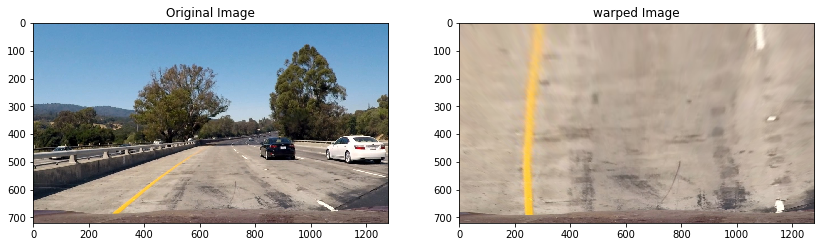

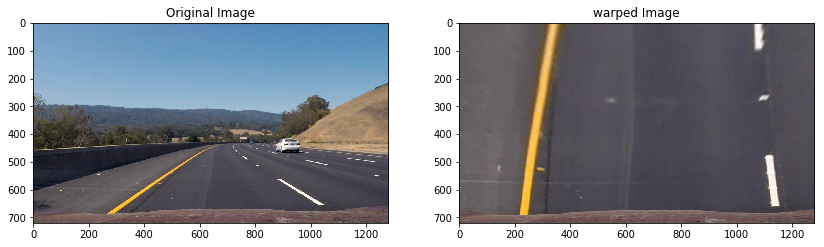

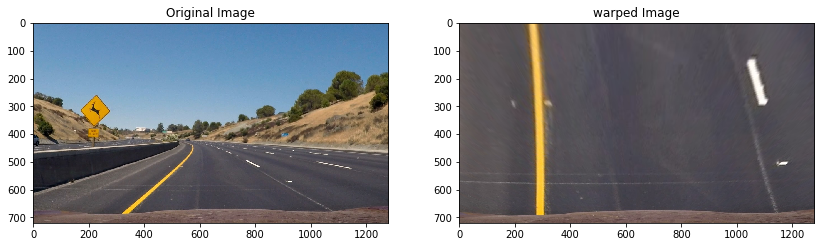

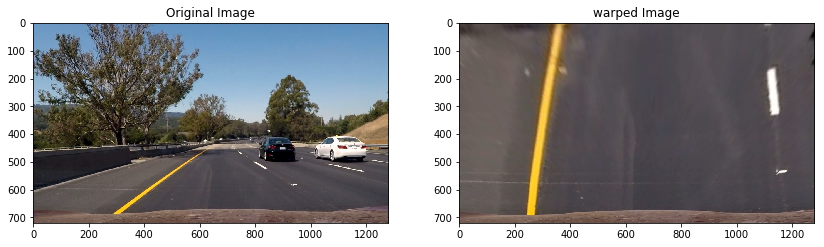

In [16]:
for image in scenarios:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 9))
    ax1.imshow(mpimg.imread(image))
    ax1.set_title("Original Image")
    ax2.imshow(Perspective_trans(mpimg.imread(image)))
    ax2.set_title("warped Image")

## Combine the perspective transform with the color threhold filter

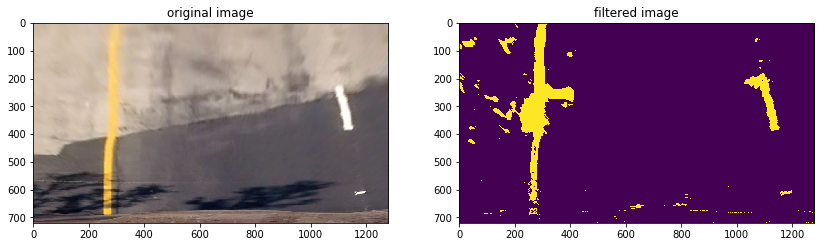

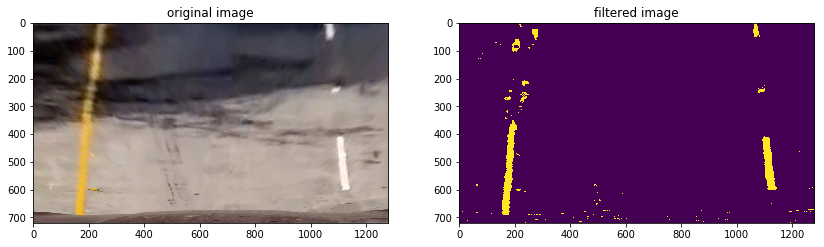

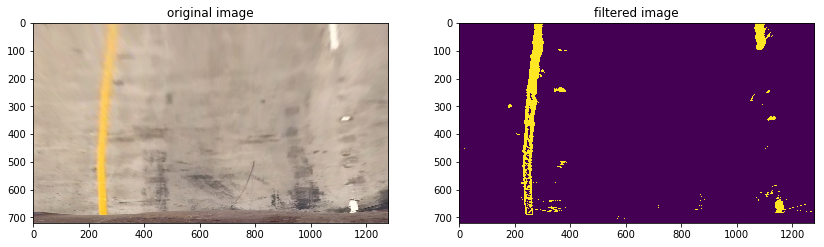

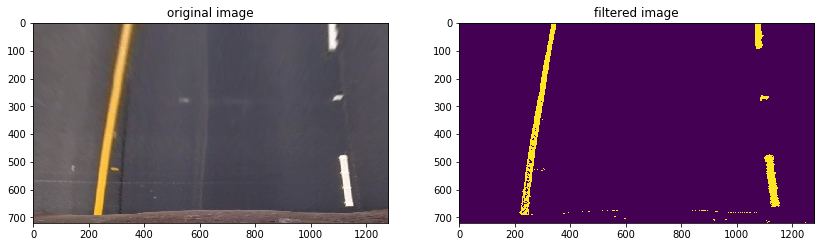

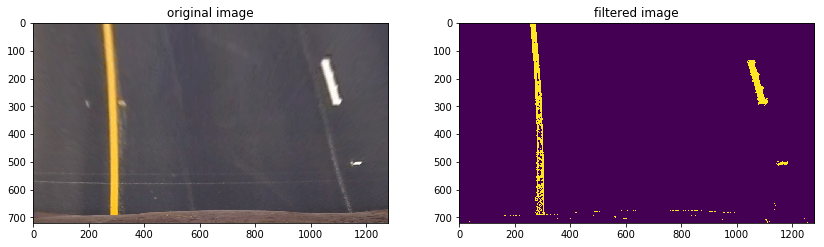

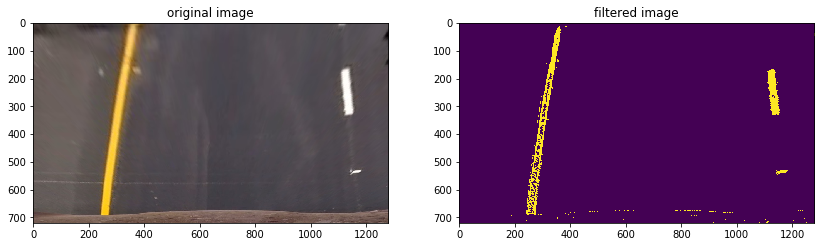

In [17]:
for image in scenarios:
    warped = Perspective_trans(mpimg.imread(image))
    hls = HLS_Color_Gradient(warped)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,9))
    ax1.imshow(warped)
    ax1.set_title('original image')
    ax2.imshow(HLS_Color_Gradient(warped))
    ax2.set_title('filtered image')
    plt.savefig("../CarND-Advanced-Lane-Lines/output_images/perspective_output.png")

## Using the sliding window to pass the detected lane and calculate the curvature

In [18]:
def sliding_wins(warped):
    

    histo = np.sum(warped[warped.shape[0]//2:, :], axis = 0)
    out_img = np.dstack((warped,warped,warped))
#     print(histo.shape)
#     print(warped.shape)
    midpoint = np.int(histo.shape[0]//2)
#     print(midpoint)
    leftx_base = np.argmax(histo[:midpoint])
    rightx_base = np.argmax(histo[midpoint:]) + midpoint
#     print(rightx_base)
    #set the hyperparameter to determine the size of the windows
    nwindows = 9
    min_pixel = 50
    margin = 100
    
    window_height = np.int(warped.shape[0]//nwindows)
    
    nonzero = warped.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    
    left_current = leftx_base
    right_current = rightx_base
   
    
    left_lane_index = []
    right_lane_index = []
    
    for window in range(nwindows):
        
        window_y_high = warped.shape[0] - window*window_height
        window_y_low = warped.shape[0] - (window+1)*window_height
        window_leftx_low = left_current - margin
        window_leftx_high = left_current + margin
        window_rightx_low = right_current - margin
        window_rightx_high = right_current + margin
#         print("window_rightx_high",window_rightx_high)
#         print("window_leftx_low",window_leftx_low)
   
        cv2.rectangle(out_img,(window_leftx_low, window_y_low),
                      (window_leftx_high, window_y_high), (0,255,0), 2)
        cv2.rectangle(out_img,(window_rightx_low, window_y_low),
                      (window_rightx_high, window_y_high), (0,255,0), 2)
        
        left_inwindow_index = ((nonzerox>=window_leftx_low)&(nonzerox<window_leftx_high)&
        (nonzeroy<window_y_high)&(nonzeroy>window_y_low)).nonzero()[0]
        right_inwindow_index = ((nonzerox>=window_rightx_low)&(nonzerox<window_rightx_high)&
        (nonzeroy<window_y_high)&(nonzeroy>window_y_low)).nonzero()[0]

        
        left_lane_index.append(left_inwindow_index)
        right_lane_index.append(right_inwindow_index)
        
        if len(left_inwindow_index) > min_pixel:
            left_current = np.int(np.mean(nonzerox[left_inwindow_index]))
        if len(right_inwindow_index) > min_pixel:        
            right_current = np.int(np.mean(nonzerox[right_inwindow_index]))

    try:
        left_lane_index = np.concatenate(left_lane_index)
        right_lane_index = np.concatenate(right_lane_index)
    except ValueError:
        
        pass

    leftx = nonzerox[left_lane_index]
    rightx = nonzerox[right_lane_index]
    lefty = nonzeroy[left_lane_index]
    righty = nonzeroy[right_lane_index]
        
        
    return leftx, rightx, lefty, righty, out_img


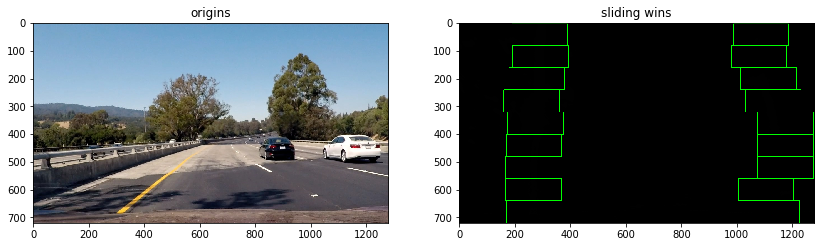

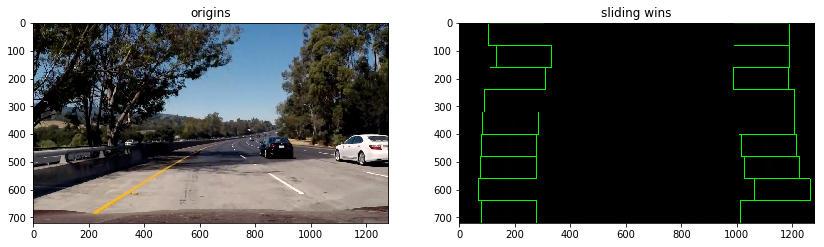

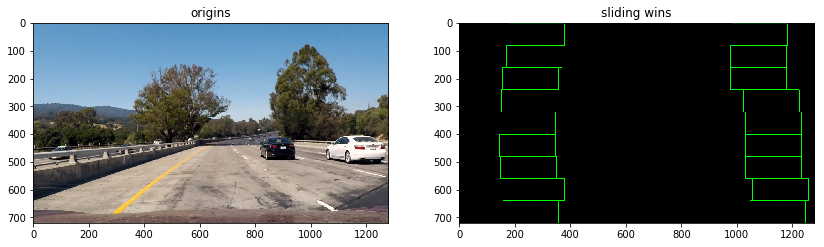

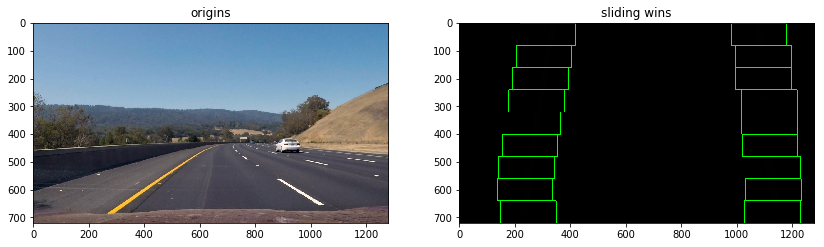

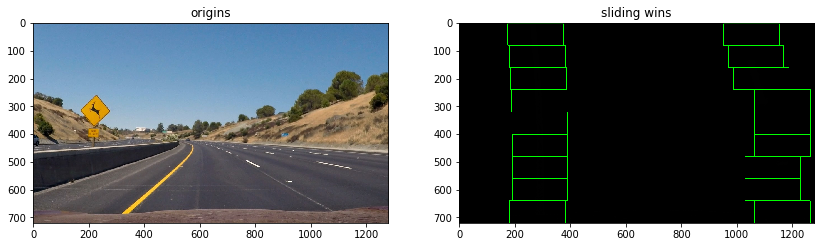

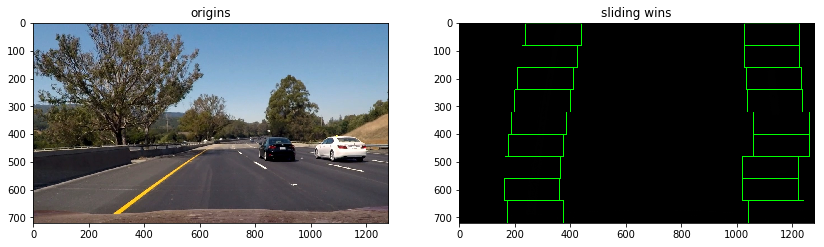

In [19]:
np.set_printoptions(threshold=np.inf)
for image in scenarios:
    pers = Perspective_trans(mpimg.imread(image))
    filtered = HLS_Color_Gradient(pers)
    leftx, rightx, lefty, righty, outimg = sliding_wins(filtered)
    f, (ax1,ax2) = plt.subplots(1,2,figsize = (14,9))
    ax1.imshow(mpimg.imread(image))
    ax1.set_title('origins')
    ax2.imshow(outimg)
    ax2.set_title('sliding wins')

## Detect the Lane pixel and try to find lane boundary

* probably i should write a Lane class to store the different value of the Lane
* what should i in this lane class write? which function i should define in the lane class

In [20]:
# def generate_data(ym_per_pix, xm_per_pix):
#     '''
#     Generates fake data to use for calculating lane curvature.
#     In your own project, you'll ignore this function and instead
#     feed in the output of your lane detection algorithm to
#     the lane curvature calculation.
#     '''
#     # Set random seed number so results are consistent for grader
#     # Comment this out if you'd like to see results on different random data!
#     np.random.seed(0)
   
#     ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
#     quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
#     # For each y position generate random x position within +/-50 pix
#     # of the line base position in each case (x=200 for left, and x=900 for right)
#     leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
#                                     for y in ploty])
#     rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
#                                     for y in ploty])

#     leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
#     rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

#     # Fit a second order polynomial to pixel positions in each fake lane line
#     # Fit new polynomials to x,y in world space
#     left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
#     right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
#     return ploty, left_fit_cr, right_fit_cr
    
# def measure_curvature_real():
#     '''
#     Calculates the curvature of polynomial functions in meters.
#     '''
#     # Define conversions in x and y from pixels space to meters
#     ym_per_pix = 30/720 # meters per pixel in y dimension
#     xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
#     # Start by generating our fake example data
#     # Make sure to feed in your real data instead in your project!
#     ploty, left_fit_cr, right_fit_cr = generate_data(ym_per_pix, xm_per_pix)
    
#     # Define y-value where we want radius of curvature
#     # We'll choose the maximum y-value, corresponding to the bottom of the image
#     y_eval = np.max(ploty)
    
#     # Calculation of R_curve (radius of curvature)
#     left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
#     right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
#     return left_curverad, right_curverad


# # Calculate the radius of curvature in meters for both lane lines
# left_curverad, right_curverad = measure_curvature_real()

# print(left_curverad, 'm', right_curverad, 'm')

In [21]:
# def fit_poly(warped):
    
#     leftx, rightx, lefty, righty, out_img = sliding_wins(warped)
    
#     left_poly = np.polyfit(lefty, leftx, 2)
#     right_poly = np.polyfit(righty, rightx, 2)

#     ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    
#     try:
#         plotx_left = left_poly[0]*ploty**2 + left_poly[1]*ploty + left_poly[2]
#         plotx_right = right_poly[0]*ploty**2 + right_poly[1]*ploty + right_poly[2]
#     except TypeError:
#         print('The function failed to fit a line!')
#         plotx_left = 1*ploty**2 + 1*ploty
#         plotx_right = 1*ploty**2 + 1*ploty
        
    
# #   visualisierung:这里分两层  一是把active的 像素点染色 二是把 poly 在图上plot出来
   
#     out_img[lefty, leftx] = [255, 0, 0]
#     out_img[righty, rightx] =[0, 0, 255]
  
#     plt.plot(plotx_left, ploty, color = "yellow")
#     plt.plot(plotx_right, ploty, color = "yellow")

#     return out_img

def fit_poly(img):
    
    pers = Perspective_trans(img)
    binary_warped = HLS_Color_Gradient(pers)
    warped = HLS_Color_Gradient(img)
    # Find our lane pixels first
    leftx, rightx, lefty, righty, out_img = sliding_wins(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(lefty)
    
    
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
     # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    

    
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]

    center = abs(640 - ((rightx_int+leftx_int)/2))
    
    offset = 0 
    #img_size = (binary_warped.shape[1], binary_warped.shape[0])
    src = np.float32([[490, 482], [810, 482],
                      [1250, 720], [40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                      [1250, 720], [40, 720]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    
     # Calculate the vehicle position relative to the center of the lane
    position = (rightx_int + leftx_int)/2
    distance_from_center = abs((640 - position) * 3.7 / 700) 
                
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_(pts), (34,255,34))
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0]))
    result = cv2.addWeighted(img, 1, newwarp, 0.5, 0)
        
    # Print distance from center on video
    if position > 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((left_curverad+right_curverad)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)

    return result


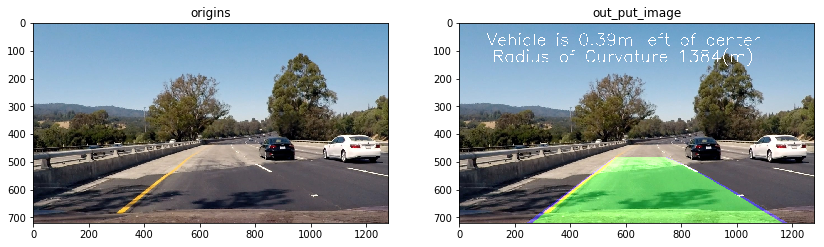

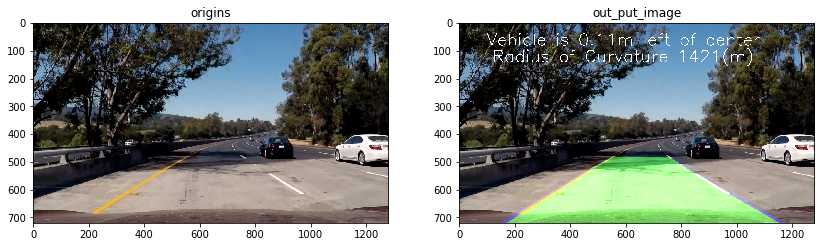

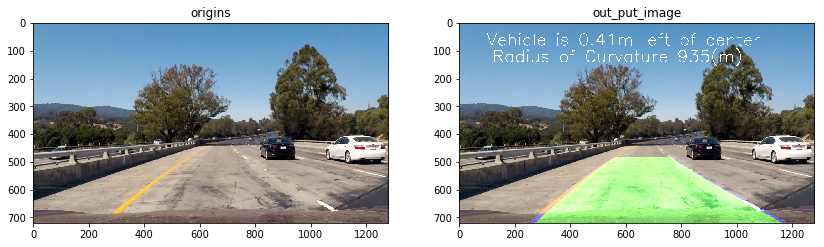

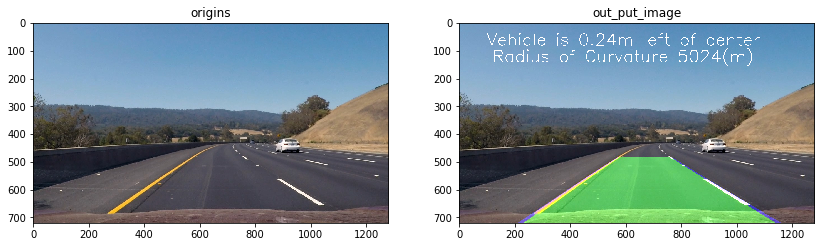

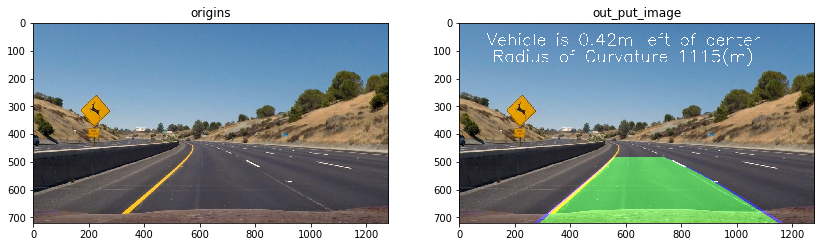

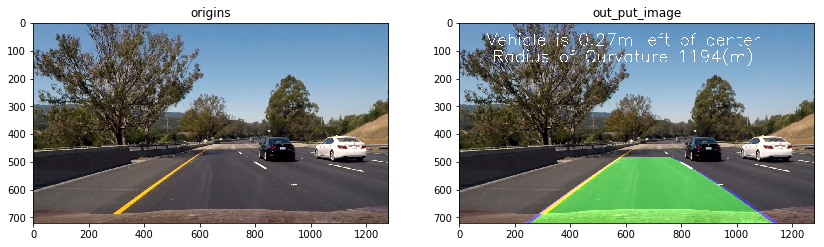

In [22]:
for image in scenarios:
#     pers = Perspective_trans(mpimg.imread(image))
#     filtered = HLS_Color_Gradient(pers)
    img = mpimg.imread(image)
    poly = fit_poly(img)
    f, (ax1,ax2) = plt.subplots(1,2,figsize = (14,9))
    ax1.imshow(mpimg.imread(image))
    ax1.set_title('origins')
    ax2.imshow(poly)
    ax2.set_title('out_put_image')

In [23]:
a =np.array([0,0,0,1,3,4,5,6,7,8,0])
print(a.nonzero())

(array([3, 4, 5, 6, 7, 8, 9]),)


In [24]:
class Lane():

    def __init__(self):
        # Was the line found in the previous frame?
        self.found = False
        
        # Remember x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Store recent x intercepts for averaging across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
        
        # Remember previous x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Remember radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.pts = []
        
        # Count the number of frames
        self.count = 0
        
    def found_search(self, x, y):
        '''
        This function is applied when the lane lines have been detected in the previous frame.
        It uses a sliding window to search for lane pixels in close proximity (+/- 25 pixels in the x direction)
        around the previous detected polynomial. 
        '''
        xvals = []
        yvals = []
        if self.found == True: 
            i = 720
            j = 630
            while j >= 0:
                yval = np.mean([i,j])
                xval = (np.mean(self.fit0))*yval**2 + (np.mean(self.fit1))*yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x)&(x < (xval + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
        return xvals, yvals, self.found



In [25]:
def pipeline(image):
    undistort = undistort_op(image)
    ployf = fit_poly(undistort)
    
    return ployf

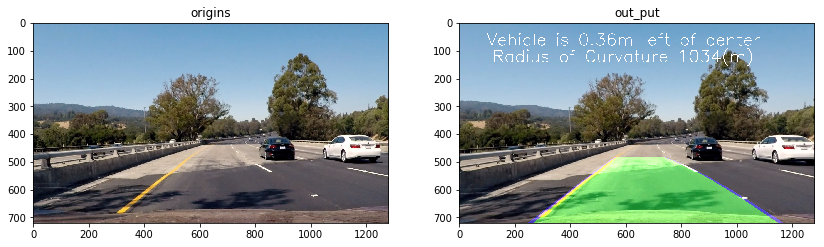

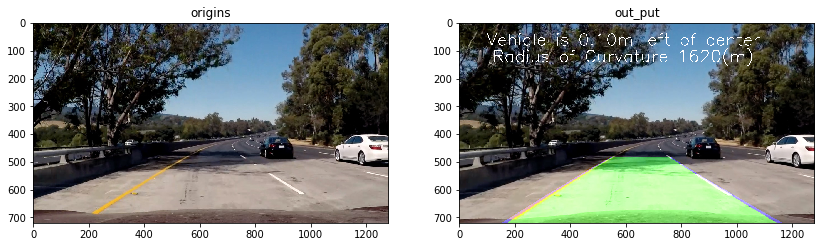

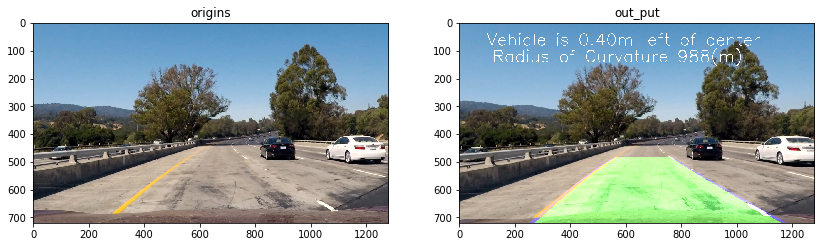

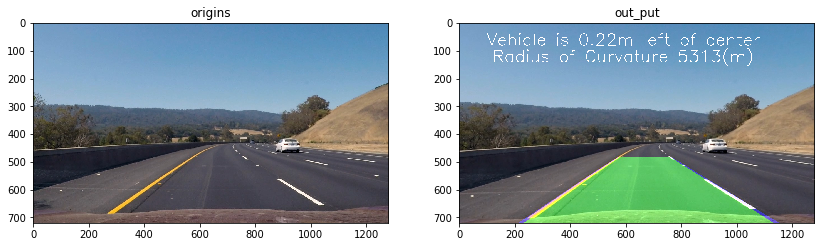

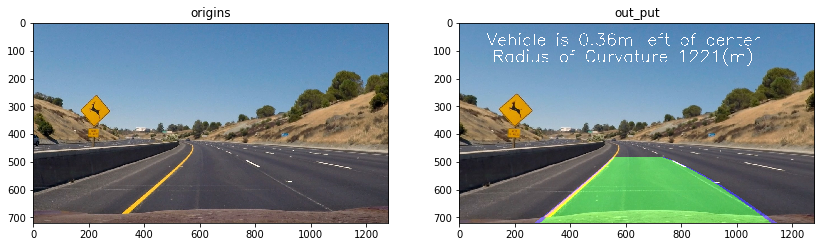

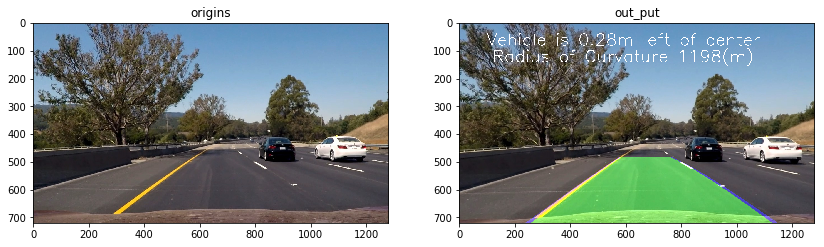

In [26]:
for image in scenarios:
    out = pipeline(mpimg.imread(image))
    f, (ax1,ax2) = plt.subplots(1,2,figsize = (14,9))
    ax1.imshow(mpimg.imread(image))
    ax1.set_title('origins')
    ax2.imshow(out)
    ax2.set_title('out_put')
    plt.savefig("../CarND-Advanced-Lane-Lines/output_images/final_output.png")

## Processing videos using the pipeline



In [27]:
video_output = 'result.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 1260/1261 [11:45<00:00,  1.84it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



In [28]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))